In [1]:
# back to project root
%cd ~/research

import gc
import os
import sys
from glob import glob

import cv2
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm
import yaml
from scipy import signal

sys.path.append("src")
from utility.logger import logger
from utility.activity_loader import get_data_dirs, load_group
from utility.functions import moving_average
from utility.json_handler import load
from utility.video import Capture, Writer, concat_field_with_frame
from visualize.group import GroupVisualizer
from visualize.individual import write_field as ind_write_field
from visualize.keypoint import write_frame as kps_write_frame

/raid6/home/yokoyama/research


/home/yokoyama/research/.venv/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
room_num = "02"
surgery_num = "001"

In [3]:
cfg_path = "config/demo_config.yaml"
with open(cfg_path, "r") as f:
    cfg = yaml.safe_load(f)
with open(cfg["config_path"]["group"], "r") as f:
    grp_cfg = yaml.safe_load(f)

In [4]:
field = cv2.imread("image/field.png")
visualizer = GroupVisualizer(["attention"])

In [5]:
data_dirs = get_data_dirs(room_num, surgery_num)
print(data_dirs)

['data/02/001/01', 'data/02/001/02', 'data/02/001/03', 'data/02/001/04', 'data/02/001/05', 'data/02/001/06', 'data/02/001/07', 'data/02/001/08', 'data/02/001/09', 'data/02/001/10', 'data/02/001/11', 'data/02/001/12', 'data/02/001/13', 'data/02/001/14', 'data/02/001/15']


In [6]:
heatmaps = []
for data_dir in data_dirs:
    print(data_dir)
    json_path = os.path.join(data_dir, ".json", "group.json")
    if os.path.exists(json_path):
        group = load_group(json_path, grp_cfg, field, logger, only_data_loading=True)
        attention_dict = group.attention
        heatmaps += list(attention_dict.values())

data/02/001/01


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4846392/4846392 [00:20<00:00, 234679.51it/s]


data/02/001/02


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6390837/6390837 [00:26<00:00, 241965.75it/s]


data/02/001/03


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8207617/8207617 [00:34<00:00, 235276.45it/s]


data/02/001/04


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7883783/7883783 [00:32<00:00, 240003.87it/s]


data/02/001/05


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10048083/10048083 [00:42<00:00, 238227.90it/s]


data/02/001/06


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10971767/10971767 [00:45<00:00, 241547.07it/s]


data/02/001/07


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 11967787/11967787 [00:50<00:00, 238762.04it/s]


data/02/001/08


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10331108/10331108 [00:43<00:00, 237796.49it/s]


data/02/001/09


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 9633156/9633156 [00:40<00:00, 238865.12it/s]


data/02/001/10


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 10553480/10553480 [00:44<00:00, 237483.13it/s]


data/02/001/11


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8692442/8692442 [00:35<00:00, 246205.32it/s]


data/02/001/12


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8537157/8537157 [00:34<00:00, 246939.05it/s]


data/02/001/13


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 7688201/7688201 [00:32<00:00, 239613.21it/s]


data/02/001/14


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 4616192/4616192 [00:19<00:00, 241758.80it/s]


data/02/001/15


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 28338/28338 [00:00<00:00, 240784.45it/s]


In [7]:
max_val = np.max(np.max(heatmaps, axis=1), axis=1)

# plt.figure(figsize=(20, 5))
# plt.plot(max_val, label="max")
# plt.xlabel("frame")
# plt.ylabel("group attention")
# plt.show()

166


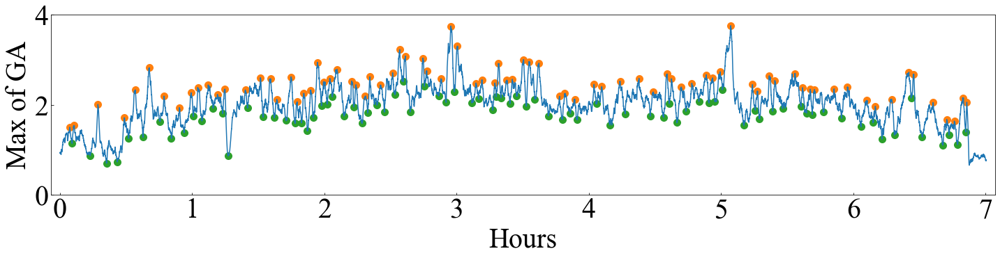

In [9]:
prominence = 0.3
ma_size = 1800
height = 1.5
height_inv = 0.5

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams["font.size"] = 40
plt.rcParams['xtick.direction'] = 'in'  # x axis in
plt.rcParams['ytick.direction'] = 'in'  # y axis in

max_val_ma = moving_average(max_val, size=ma_size)
peaks = signal.find_peaks(max_val_ma, prominence=prominence, height=height)[0]
peaks_inv = signal.find_peaks(
    max_val_ma * -1, prominence=prominence, height=(None, -height_inv)
)[0] 
print(len(peaks) + len(peaks_inv))

fig = plt.figure(figsize=(20, 5))
fig.subplots_adjust(left=0.05, right=0.99, bottom=0.23, top=0.95)

plt.plot(max_val_ma, label="max")
plt.scatter(peaks, max_val_ma[peaks], color="tab:orange", s=100)
plt.scatter(peaks_inv, max_val_ma[peaks_inv], color="tab:green", s=100)

xticks = range(0, len(max_val_ma) + 1800, 1800 * 60)
plt.xticks(xticks, [t // (1800 * 60) for t in xticks])

margin = len(max_val_ma) // 100
plt.xlim((-margin, len(max_val_ma) + margin))
plt.ylim((0, 4.0))

plt.xlabel("Hours")
plt.ylabel("Max of GA")

plt.savefig(os.path.join("data", "attention", "image", f"{room_num}_{surgery_num}.pdf"))
plt.show()

In [ ]:
def show_heatmaps(heatmap_lst, peaks, ma_size, division=20):
    indices = peaks
    selected_heatmap_lst = np.array(heatmap_lst[::ma_size])[indices]

    for frame_num, heatmap in zip(indices, selected_heatmap_lst):
        frame_num = (frame_num + 1) * ma_size
        file_num = frame_num // 54000 + 1
        frame_num = frame_num % 54000
        
        # create result for visualizing
        items = {"attention": []}
        for y in range(heatmap.shape[1]):
            for x in range(heatmap.shape[0]):
                item = {
                    "frame": frame_num,
                    "point": np.array([x, y]) * division,
                    "value": heatmap[x, y]
                }
                items["attention"].append(item)
        
        # video capture
        video_path = os.path.join("video", room_num, surgery_num, f"{file_num:02d}.mp4")
        cap = Capture(video_path)
        cap.set_pos_frame_count(frame_num)
        _, frame = cap.read()

        # visualize heatmap
        rslt_field = visualizer.write_field(
            key="attention",
            frame_num=frame_num,
            group_indicator_data=items,
            field=field.copy(),
        )
        frame = concat_field_with_frame(frame, rslt_field)
        
        print("file_num:", file_num, "minutes:", frame_num)
        plt.figure(figsize=(10, 5))
        plt.imshow(frame)
        plt.axis("off")
        plt.axis([0, frame.shape[1], frame.shape[0], 0])
        plt.show()
        
        del cap

file_num: 1 minutes: 13156


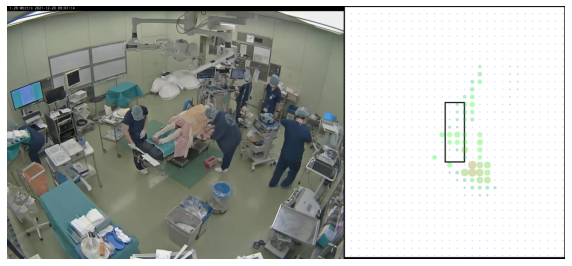

file_num: 1 minutes: 36296


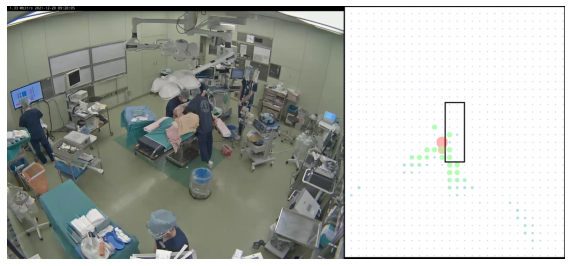

file_num: 2 minutes: 13770


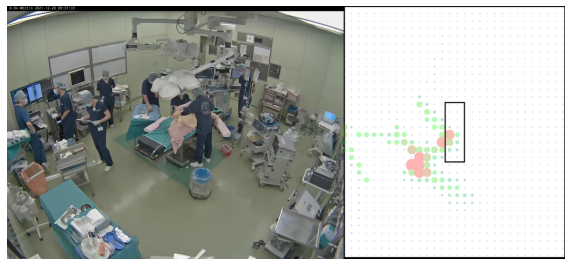

file_num: 2 minutes: 41257


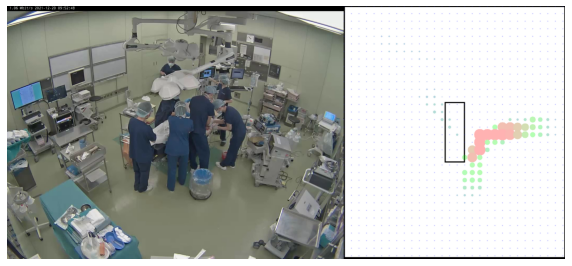

file_num: 3 minutes: 1944


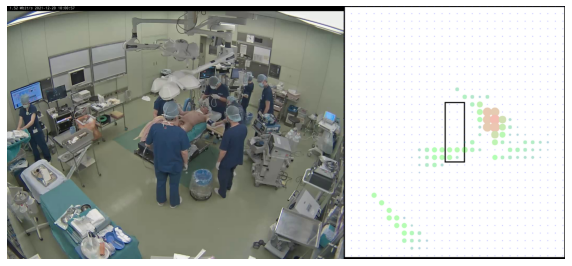

file_num: 3 minutes: 29374


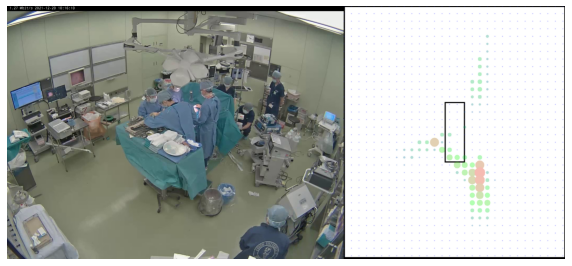

file_num: 4 minutes: 373


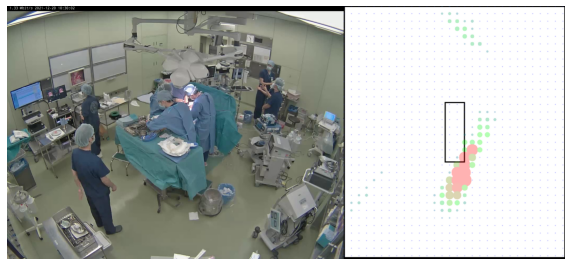

file_num: 4 minutes: 17657


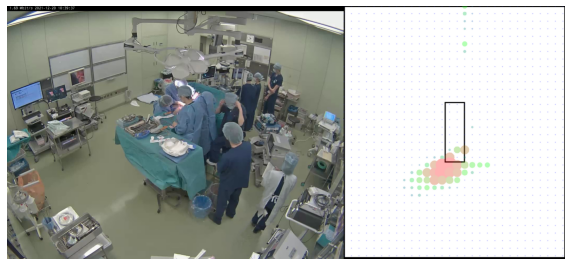

file_num: 4 minutes: 30365


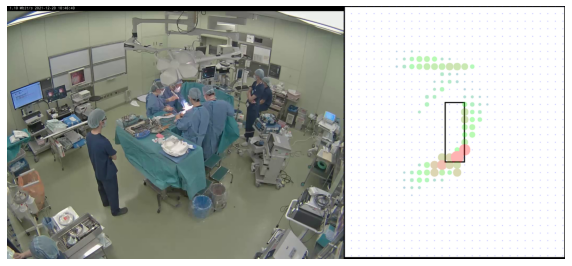

file_num: 5 minutes: 3917


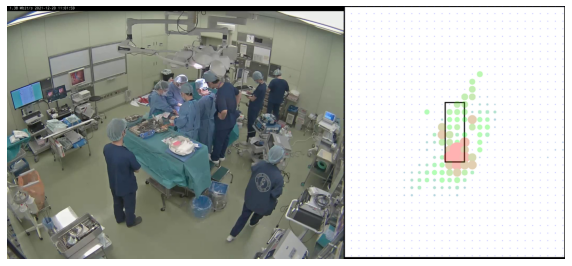

file_num: 5 minutes: 12327


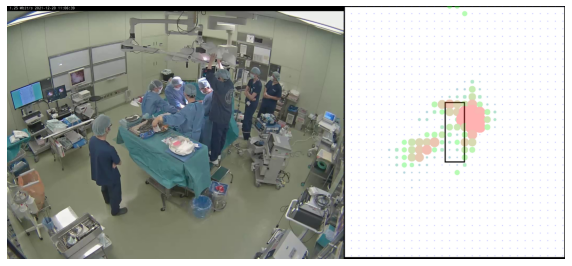

file_num: 5 minutes: 22576


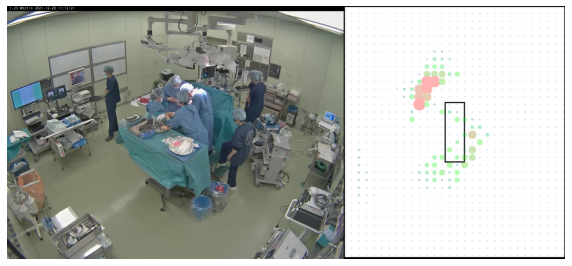

file_num: 5 minutes: 35935


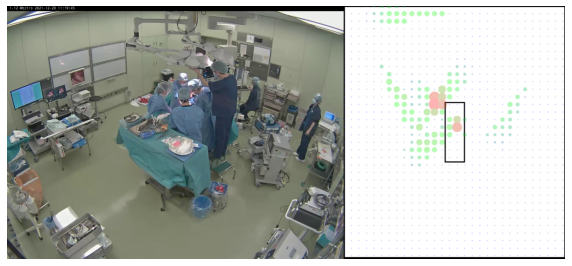

file_num: 6 minutes: 3026


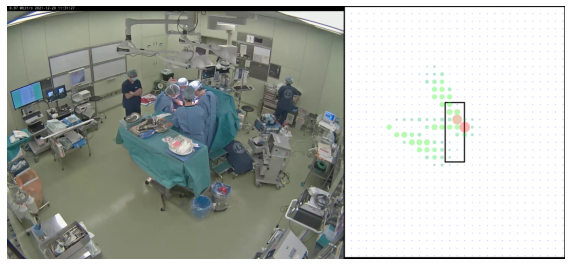

file_num: 6 minutes: 33872


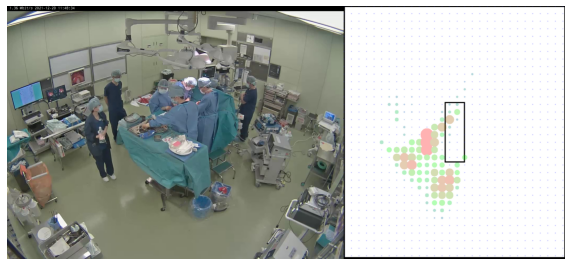

file_num: 7 minutes: 5663


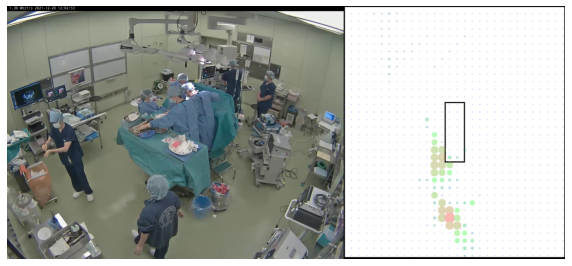

file_num: 7 minutes: 35104


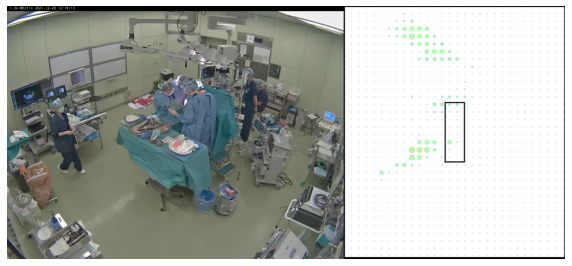

file_num: 8 minutes: 946


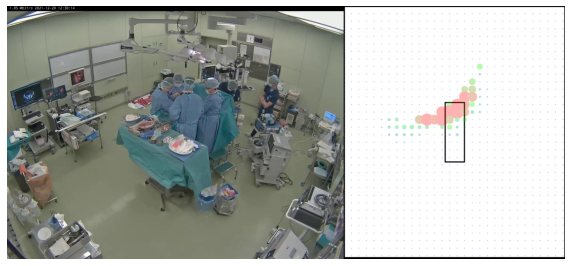

file_num: 8 minutes: 24606


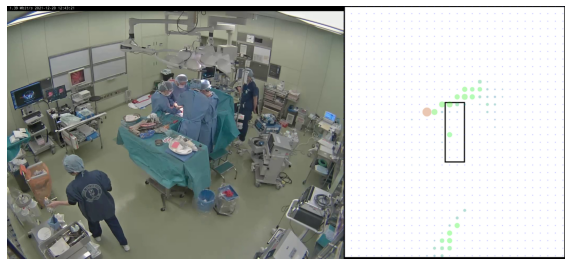

file_num: 8 minutes: 39787


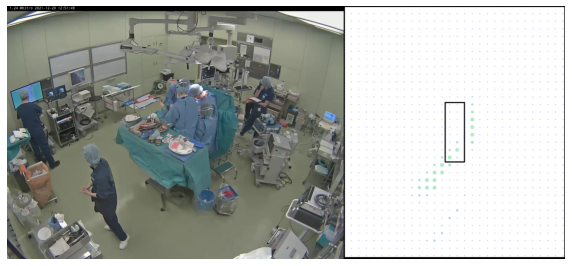

file_num: 8 minutes: 49177


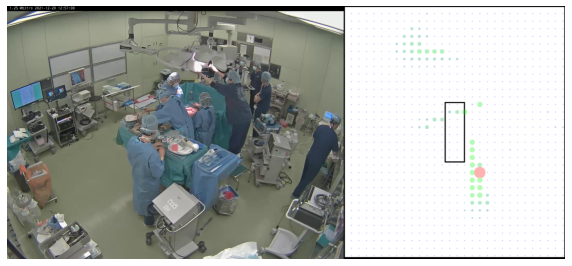

file_num: 9 minutes: 7236


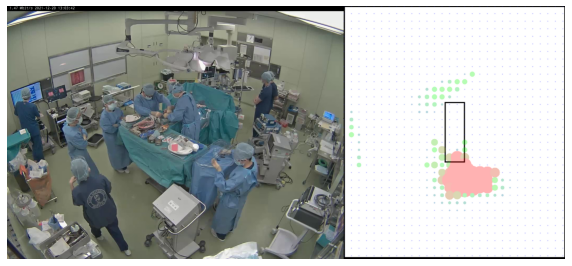

file_num: 9 minutes: 17586


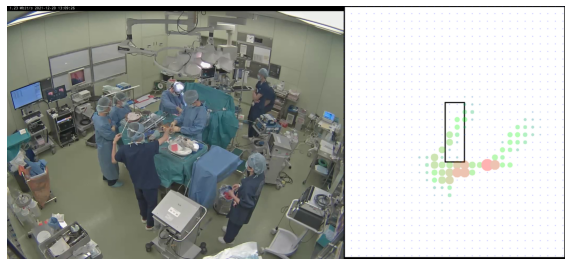

file_num: 9 minutes: 47514


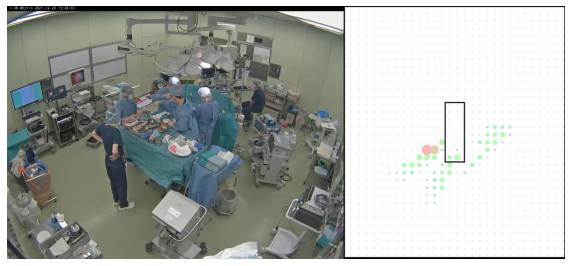

file_num: 10 minutes: 25042


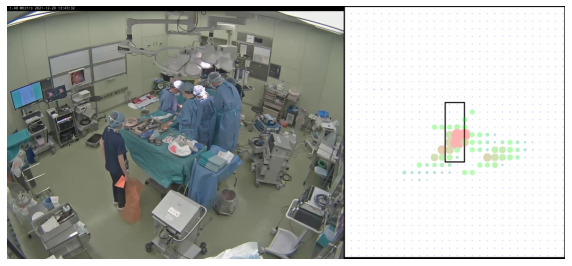

file_num: 10 minutes: 38945


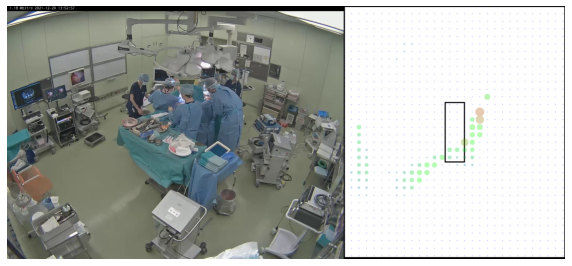

file_num: 10 minutes: 49351


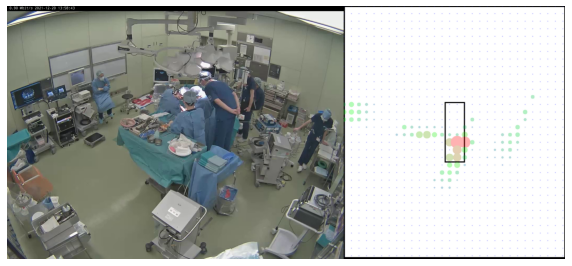

file_num: 11 minutes: 14614


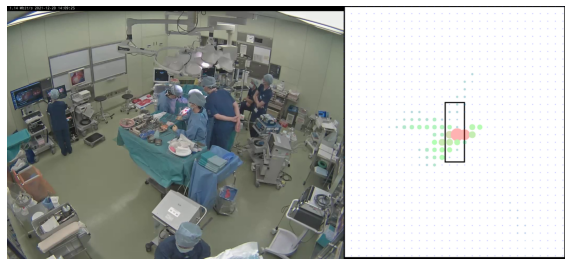

file_num: 12 minutes: 3012


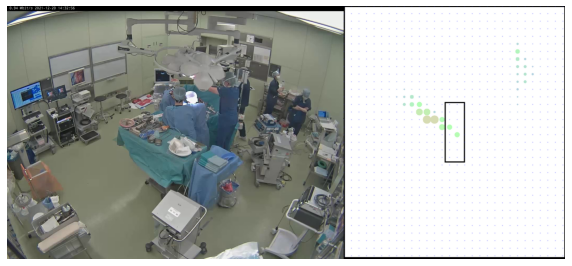

file_num: 12 minutes: 51632


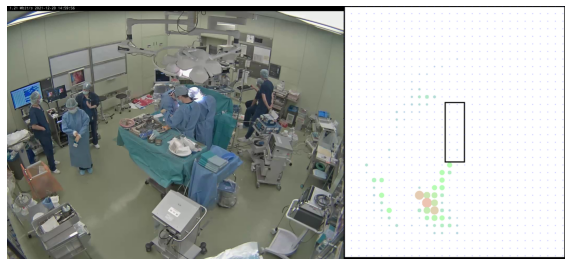

file_num: 13 minutes: 10000


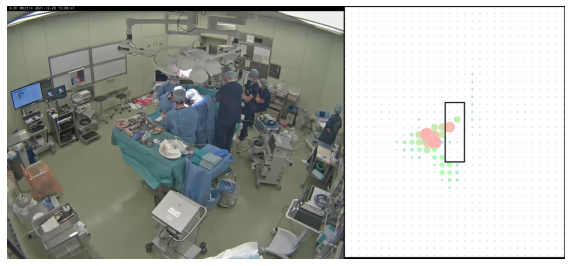

file_num: 13 minutes: 32147


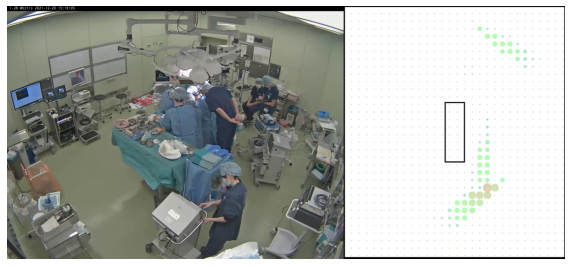

file_num: 13 minutes: 40577


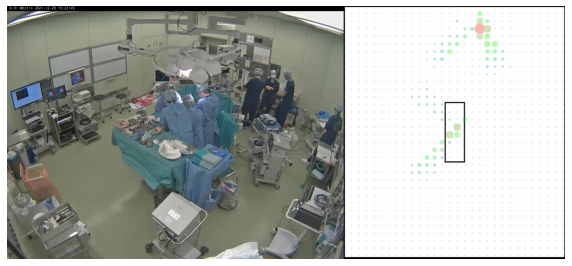

file_num: 14 minutes: 9007


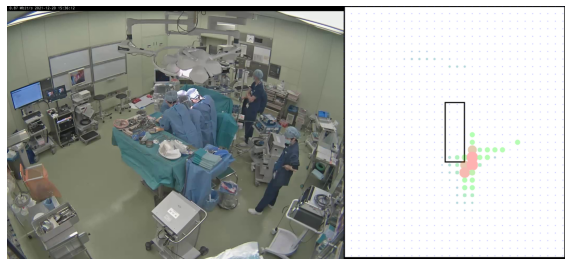

file_num: 14 minutes: 30876


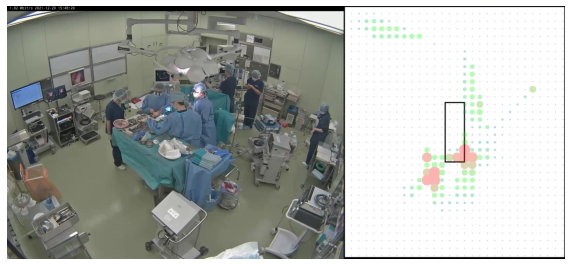

file_num: 14 minutes: 36967


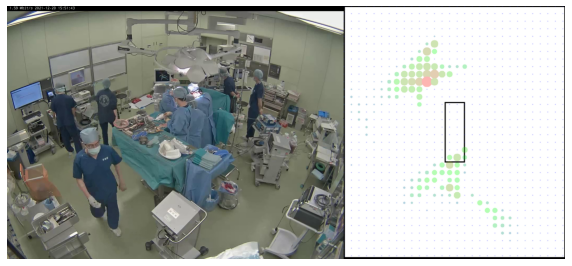

file_num: 15 minutes: 5859


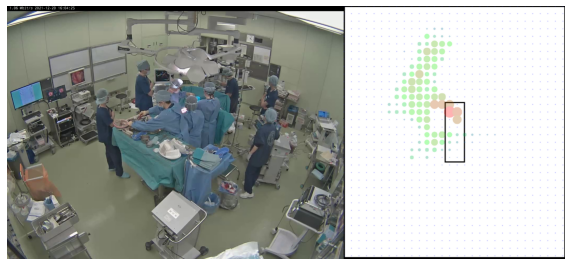

file_num: 15 minutes: 28334


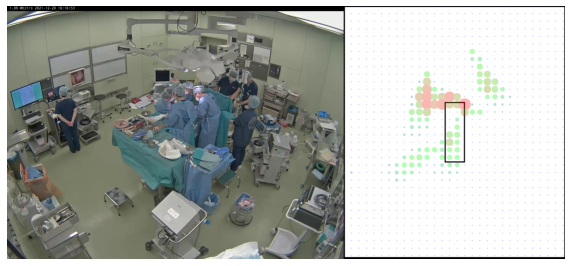

file_num: 15 minutes: 44884


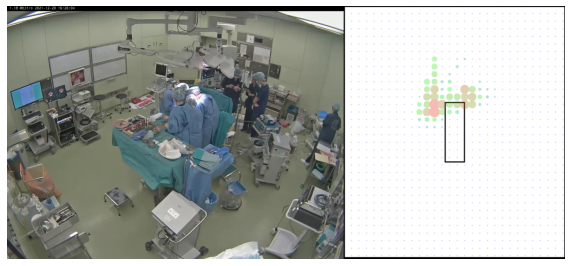

file_num: 16 minutes: 12562


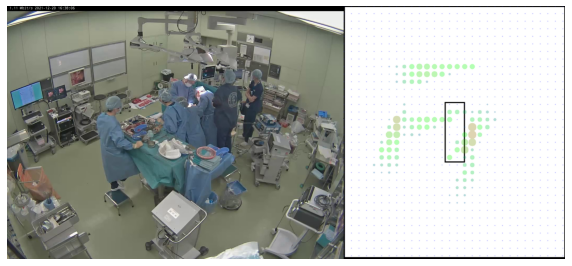

file_num: 16 minutes: 35998


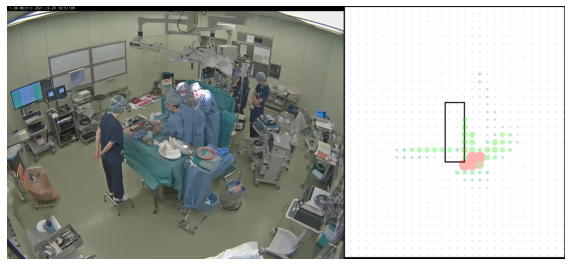

file_num: 16 minutes: 49086


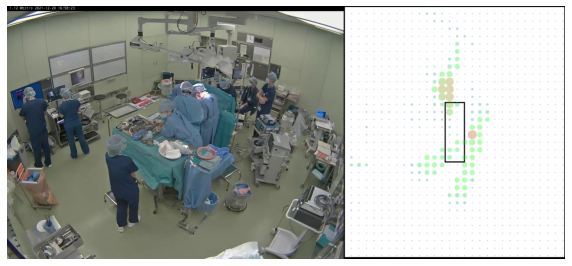

file_num: 17 minutes: 15976


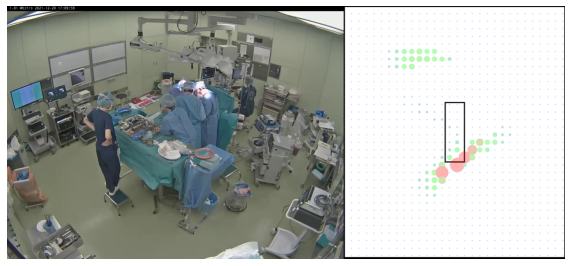

file_num: 17 minutes: 48656


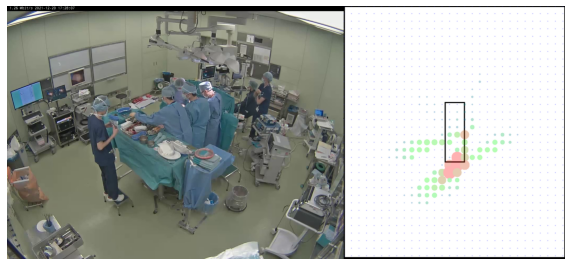

file_num: 18 minutes: 2114


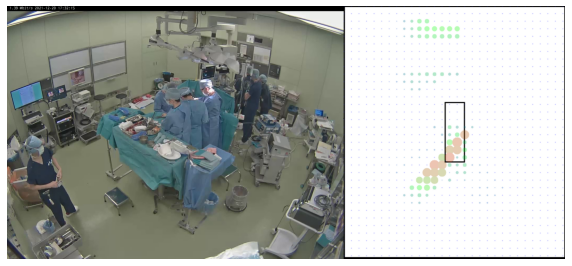

file_num: 18 minutes: 21061


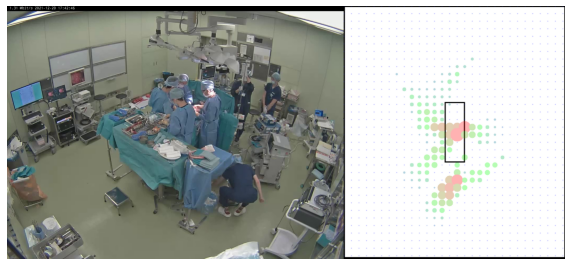

file_num: 18 minutes: 32246


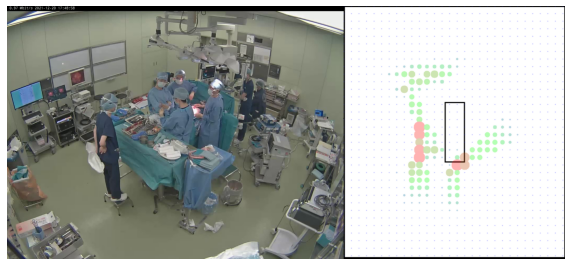

file_num: 19 minutes: 10592


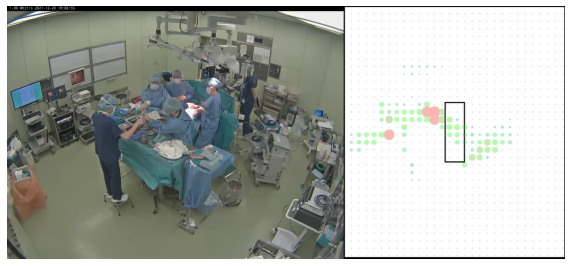

file_num: 19 minutes: 26067


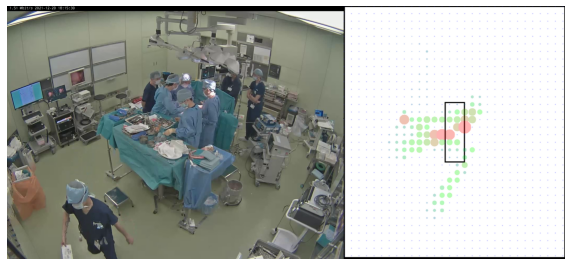

file_num: 20 minutes: 16794


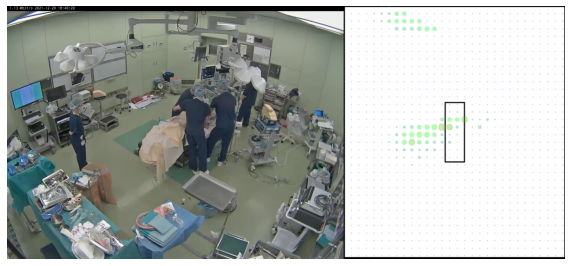

file_num: 20 minutes: 35933


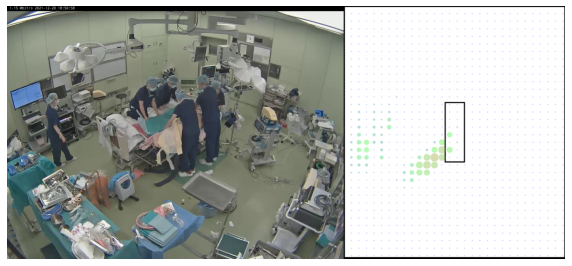

In [12]:
show_heatmaps(heatmaps, peaks_ma, 1)